# Product Sentiment Analysis

### 1. Mining


In [1]:
#Importing Libraries
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
color = sns.color_palette()  
%matplotlib inline  
import plotly.offline as py  
py.init_notebook_mode(connected=True)  
import plotly.graph_objs as go  
import plotly.tools as tls  
import plotly.express as px
print("Libraries imported successfully...")

Libraries imported successfully...


In [2]:
#Importing Data
df = pd.read_csv('Dataset-SA.csv')
print("Data imported successfully...")

Data imported successfully...


In [3]:
#Preprocess Rate column

df['Rate'] = pd.to_numeric(df['Rate'], errors='coerce')  # 'coerce' to handle non-numeric values

df['Rate'].fillna(0, inplace=True)  # Replace NaN with 0 or any other desired value

df['Rate'] = df['Rate'].astype(int)


In [4]:
df.drop("Sentiment", axis=1, inplace=True)

In [5]:
#Distribution of rate values
fig = px.histogram(df, x="Rate")  
fig.update_traces(marker_color="turquoise",marker_line_color='rgb(8,48,107)',  
                  marker_line_width=1.5)  
fig.update_layout(title_text='Product Score')  
fig.show()

In [6]:
df['Sentiment'] = df['Rate'].apply(lambda rating :"positive" if rating > 3 else ("neutral" if rating == 3 else "negative"))

In [7]:
fig = px.histogram(df, x="Sentiment")  
fig.update_traces(marker_color="indianred",marker_line_color='rgb(8,48,107)',  
                  marker_line_width=1.5)  
fig.update_layout(title_text='Product Sentiment')  
fig.show()

### 2. EDA

[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


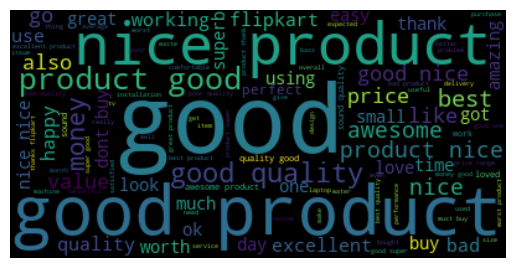

In [8]:
import nltk  
from nltk.corpus import stopwords# Create stopword list:  
from wordcloud import WordCloud  # Add this import for WordCloud

nltk.download('stopwords')

stopwords = set(stopwords.words('english'))  # Use 'words' method to get English stopwords
stopwords.update(["br", "href"]) 

df['Summary'] = df['Summary'].astype(str)

textt = " ".join(review for review in df.Summary)  
wordcloud = WordCloud(stopwords=stopwords).generate(textt)
plt.imshow(wordcloud, interpolation='bilinear')  
plt.axis("off")  
plt.savefig('wordcloud11.png')  
plt.show()


In [9]:
# splitdf - positive and negative sentiment:
positive = df[df['Sentiment'] == 'positive']  
negative = df[df['Sentiment'] == 'negative']
neutral = df[df['Sentiment'] == 'neutral']


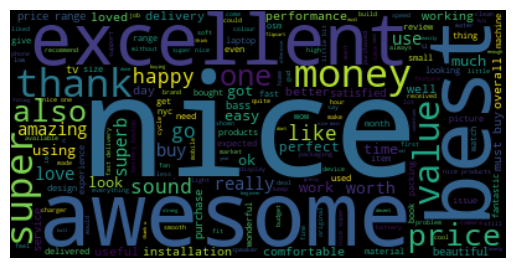

In [10]:
#Wordcloud for positive reviews

stopwords.update(["br", "href","good","bad","great", "quality", "product", "flipkart"]) ## good and great removed because they were included in negative sentiment
pos = " ".join(review for review in positive.Summary)  
wordcloud2 = WordCloud(stopwords=stopwords).generate(pos)
plt.imshow(wordcloud2, interpolation='bilinear')  
plt.axis("off")  
plt.savefig('wordcloud22.png')  
plt.show()

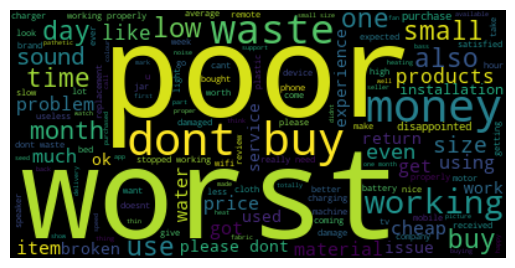

In [11]:
#Wordcloud for negative sentiment 
neg = " ".join(review for review in negative.Summary)  
wordcloud3 = WordCloud(stopwords=stopwords).generate(neg)
plt.imshow(wordcloud3, interpolation='bilinear')  
plt.axis("off")  
plt.savefig('wordcloud33.png')  
plt.show()

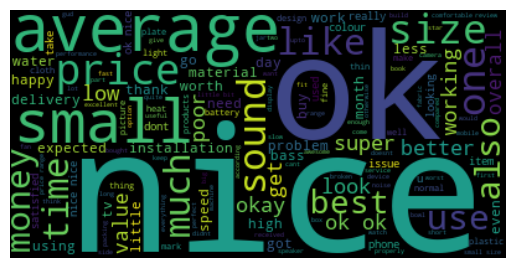

In [12]:
#Wordcloud for neutral sentiment 
neut = " ".join(review for review in neutral.Summary)  
wordcloud4 = WordCloud(stopwords=stopwords).generate(neut)
plt.imshow(wordcloud4, interpolation='bilinear')  
plt.axis("off")  
plt.savefig('wordcloud44.png')  
plt.show()


### 3. Model selection

In [13]:
# Remove punctuation
def remove_punctuation(text):  
    final = "".join(u for u in text if u not in ("?", ".", ";", ":",  "!",'"'))  
    return final

df = df.dropna(subset=['Summary'])  
df['Summary'] = df['Summary'].apply(remove_punctuation)


In [14]:
Newdf = df.loc[:,['Summary', 'Sentiment']]
Newdf

,Summary,Sentiment
0,great cooler excellent air flow and for this p...,positive
1,best budget 2 fit cooler nice cooling,positive
2,the quality is good but the power of air is de...,neutral
3,very bad product its a only a fan,negative
4,ok ok product,neutral
...,...,...
205047,good product,positive
205048,nice,positive
205049,very nice and fast delivery,neutral
205050,awesome product,positive


In [15]:
# random split train and test dataindex = df.index  
index = df.index

df['random_number'] = np.random.randn(len(index))
train = df[df['random_number'] <= 0.8]  
test = df[df['random_number'] > 0.8]  

In [16]:
# Create a bag of word using count vectorizer:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(token_pattern=r'\b\w+\b')
train_matrix = vectorizer.fit_transform(train['Summary'])  
test_matrix = vectorizer.transform(test['Summary'])

In [17]:
from sklearn.linear_model import LogisticRegression  
lr = LogisticRegression()

In [18]:
X_train = train_matrix  
X_test = test_matrix  
y_train = train['Sentiment']  
y_test = test['Sentiment']

In [19]:
lr.fit(X_train,y_train)

c:\Users\User\.conda\envs\NewEnv\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [20]:
predictions = lr.predict(X_test)

In [21]:
from sklearn.metrics import confusion_matrix,classification_report  
new = np.asarray(y_test)  
confusion_matrix(predictions,y_test)

array([[ 4931,   687,   327],
       [  264,   478,   321],
       [  602,  2318, 33451]], dtype=int64)

In [22]:
print(classification_report(predictions,y_test))

              precision    recall  f1-score   support

    negative       0.85      0.83      0.84      5945
     neutral       0.14      0.45      0.21      1063
    positive       0.98      0.92      0.95     36371

    accuracy                           0.90     43379
   macro avg       0.66      0.73      0.67     43379
weighted avg       0.94      0.90      0.92     43379



In [23]:
import joblib

joblib.dump(lr, 'lr_trained_model')

print('Model saved successfully...')

Model saved successfully...
